In [23]:
import argparse
import os

import numpy as np
import pandas as pd
import torch
from torch.utils.data import DataLoader
import segmentation_models_pytorch as smp
from importlib import import_module
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torchvision
import torchvision.transforms as transforms
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import compute_unary, unary_from_softmax
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

In [4]:
num_classes=12
model='DeepLabV3Plus_SeResNext101'
dataset='CustomDataLoader'
batch_size=16
data_dir='/opt/ml/input/data'
test_name='test.json'
output_dir='./output'
test_augmentation='TestAugmentation'
num_workers=2
model_dir='./model/DeepLabV3Plus_SeResNext101_Adamp_0.0001_cutout30_plus_pseudo_cos_softcrossentropyloss0.52'
output_name='DeepLabV3Plus_SeResNext101_Adamp_0.0001_cutout30_plus_pseudo_cos_softcrossentropyloss0.5_crf.csv'

In [5]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")

In [7]:
model=smp.DeepLabV3Plus(encoder_name='se_resnext101_32x4d',classes=num_classes,encoder_weights='imagenet',activation=None)

In [8]:
model_path = os.path.join(model_dir, 'best.pth')
model.load_state_dict(torch.load(model_path,map_location=device))
model.to(device)

DeepLabV3Plus(
  (encoder): SENetEncoder(
    (layer0): Sequential(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu1): ReLU(inplace=True)
      (pool): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    )
    (layer1): Sequential(
      (0): SEResNeXtBottleneck(
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
        (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    

In [10]:
test_path=os.path.join(data_dir,test_name)
dataset_module=getattr(import_module('dataset'),dataset)   # default : CustomDataLoader
test_transform_module = getattr(import_module("dataset"), test_augmentation)  # default: TestAugmentation
test_transform=test_transform_module()  # augmentation 에 입력값을 넣어주고 싶으면 TestAugmentation을 수정하고 여기에 넣어주면된다.
# test dataset
test_dataset = dataset_module(data_dir=test_path, mode='test', transform=test_transform)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


/opt/ml/realcode/dataset.py:112: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  new_data=np.array(new_data)


In [12]:
def collate_fn(batch):
    return tuple(zip(*batch))

test_loader = torch.utils.data.DataLoader(dataset=test_dataset,
                                        batch_size=batch_size,
                                        num_workers=num_workers,
                                        collate_fn=collate_fn)
submission = pd.read_csv('./submission/sample_submission.csv', index_col=None)

In [13]:
size = 256
transform = A.Compose([A.Resize(256, 256)])
print('Start prediction.')
model.eval()

file_name_list = []
preds_array = np.empty((0, size*size), dtype=np.long)

Start prediction.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


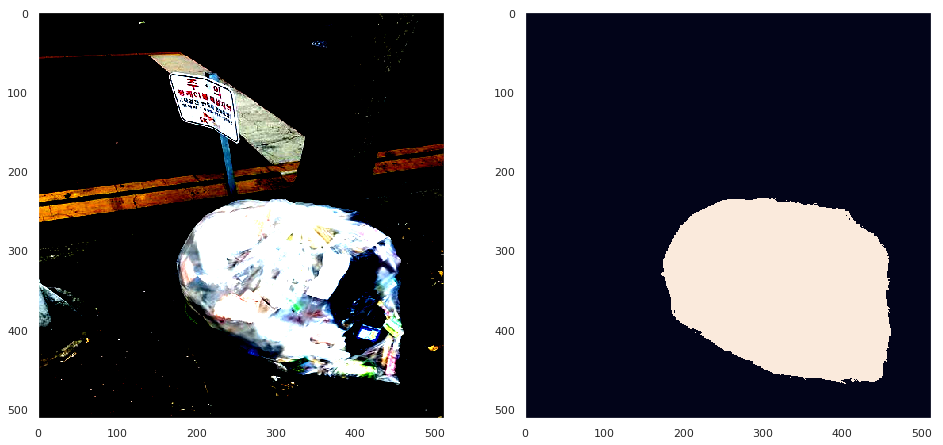

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


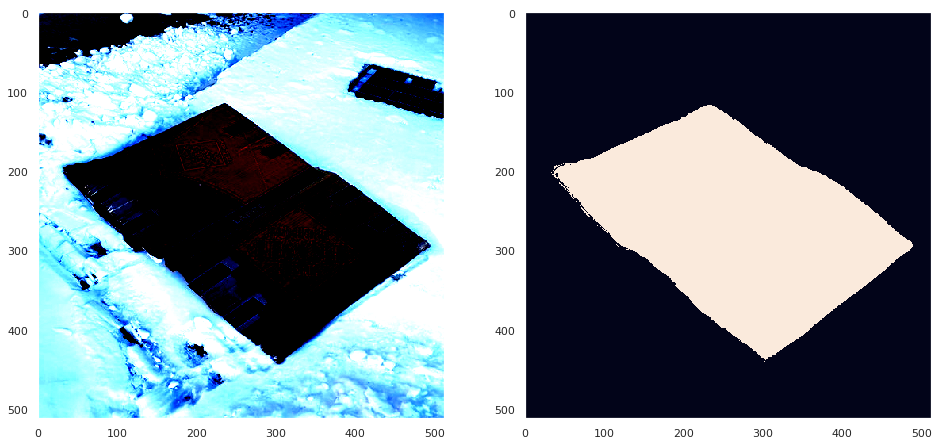

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


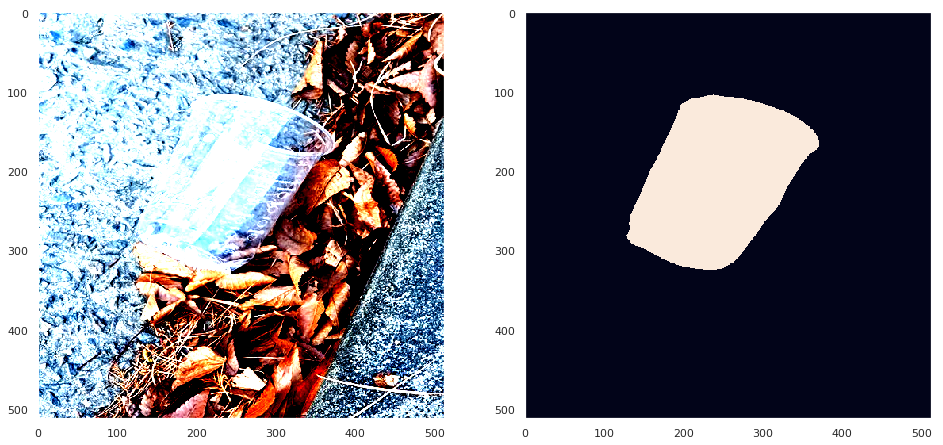

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


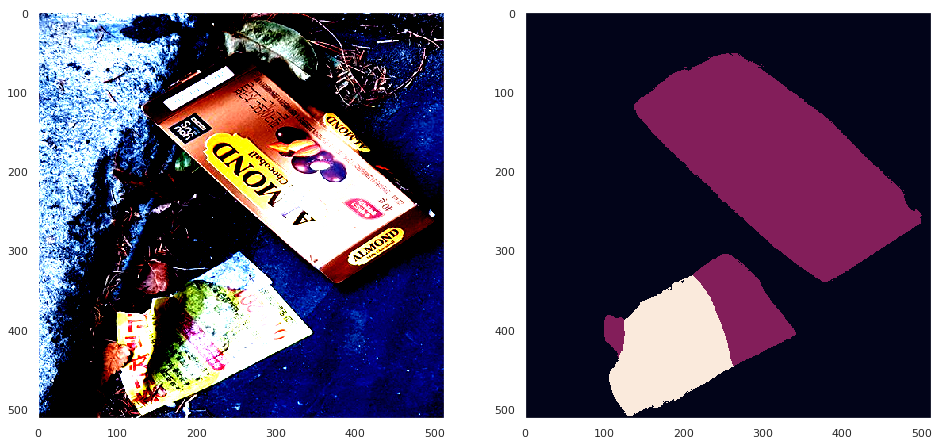

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


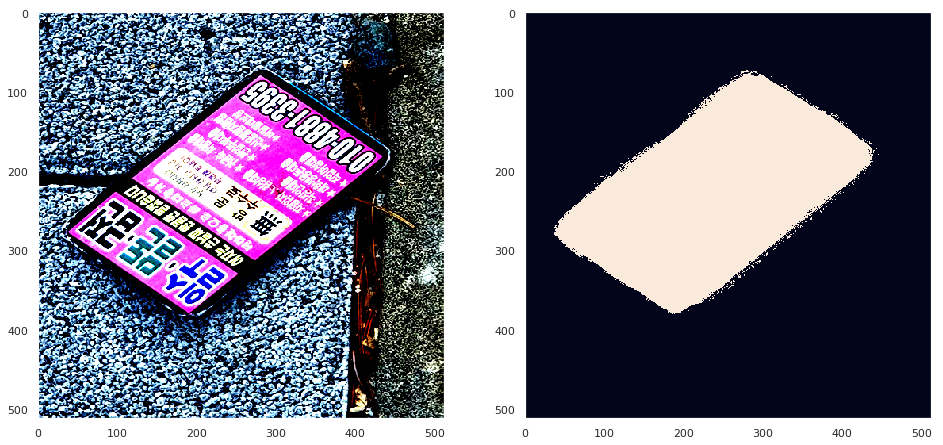

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


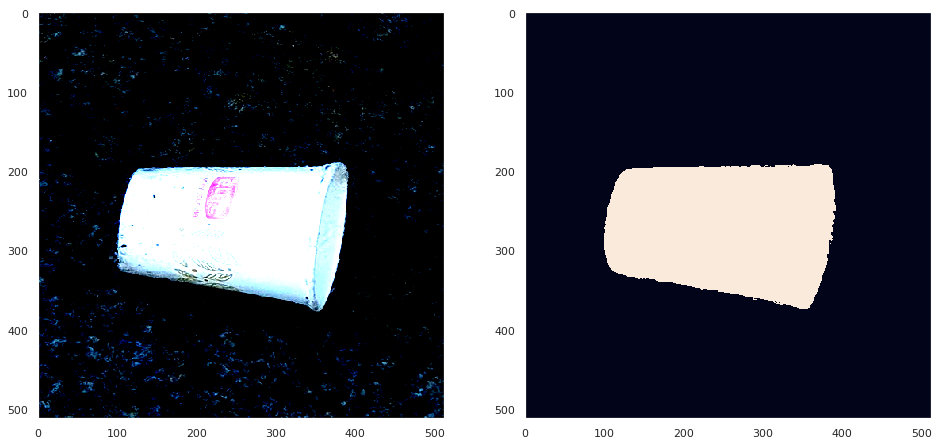

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


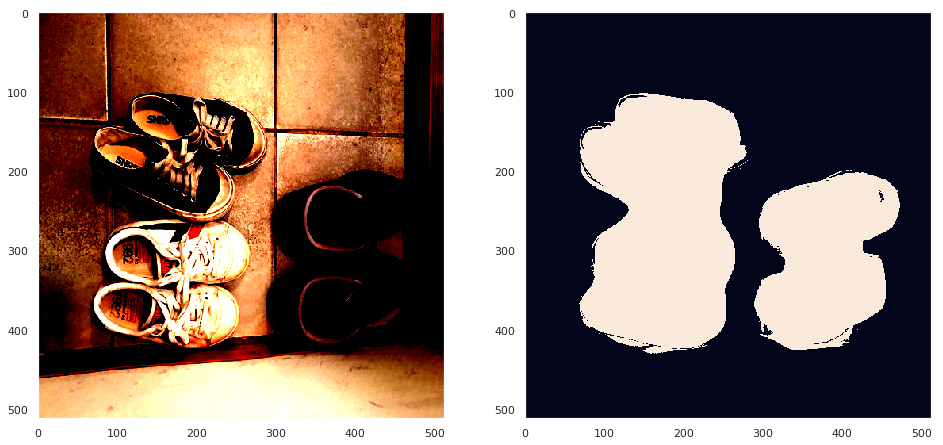

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


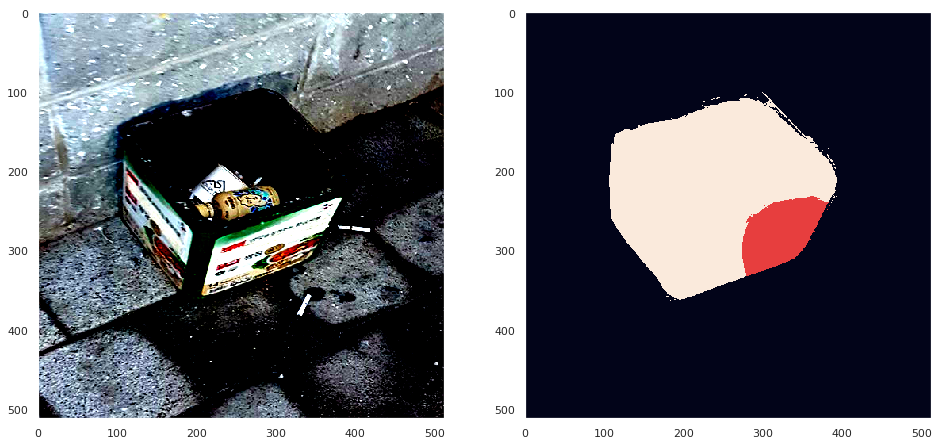

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


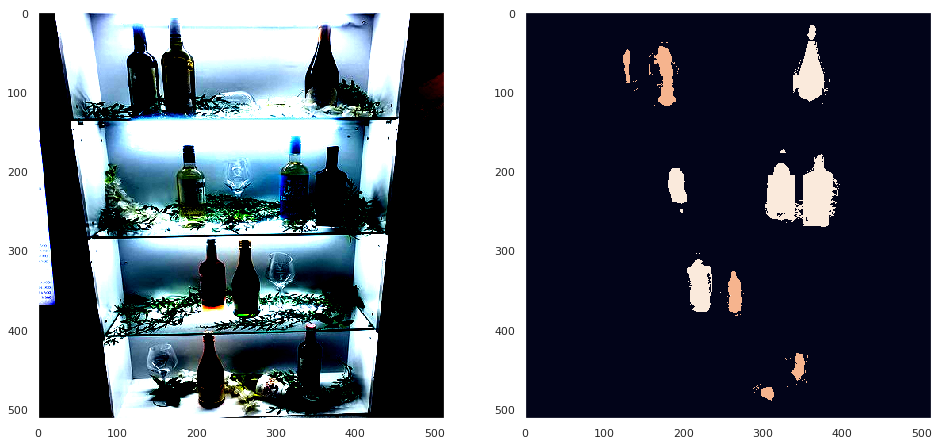

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


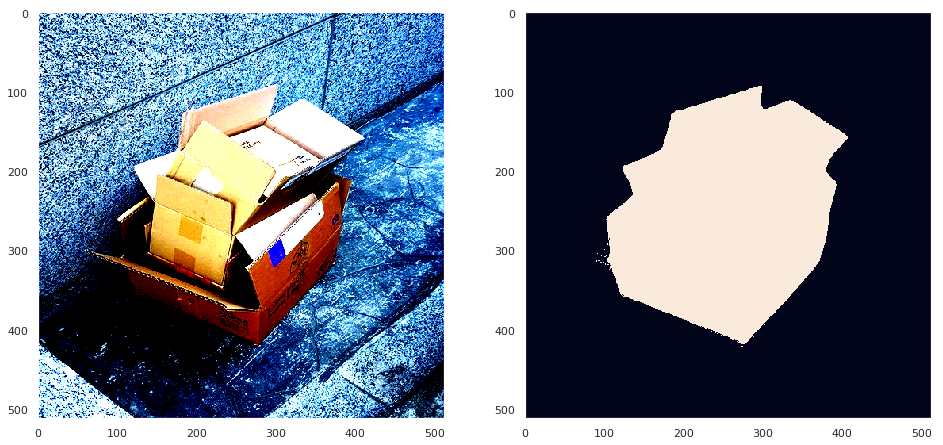

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


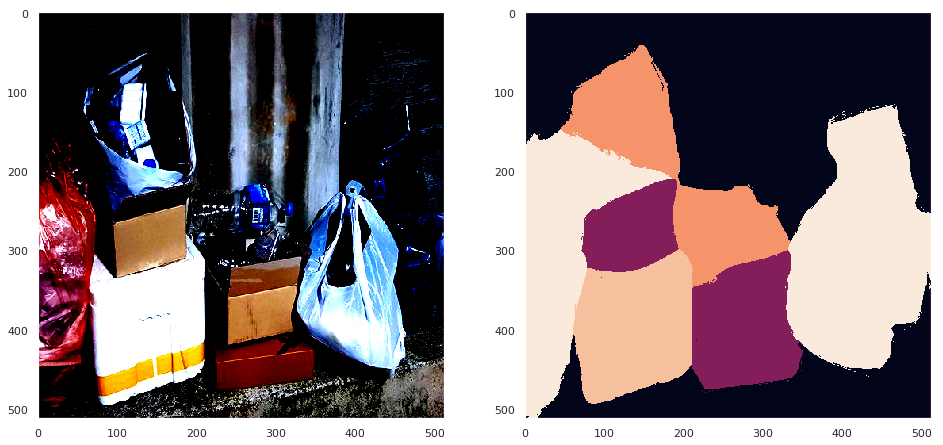

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


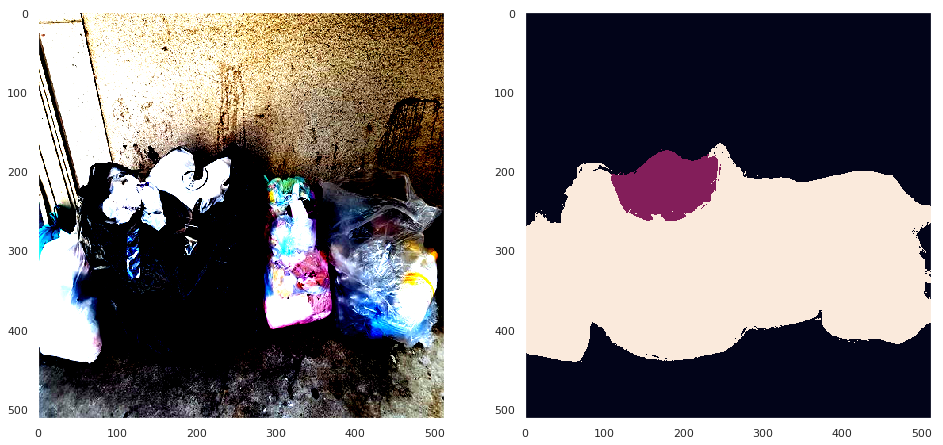

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


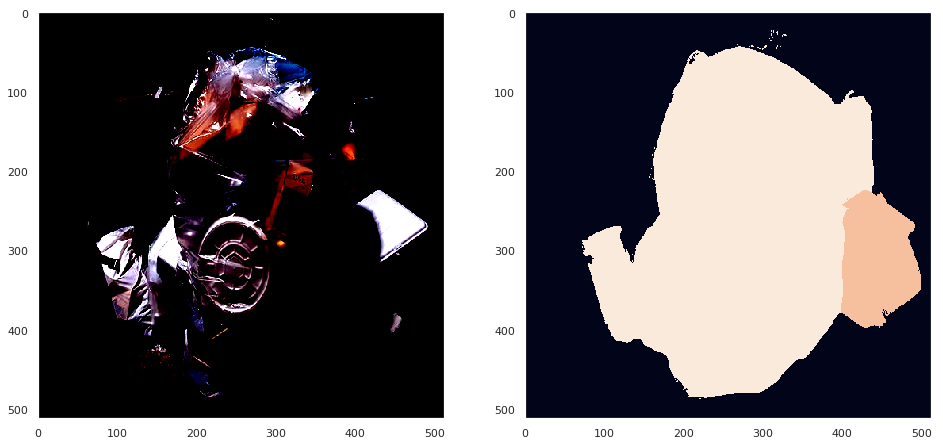

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


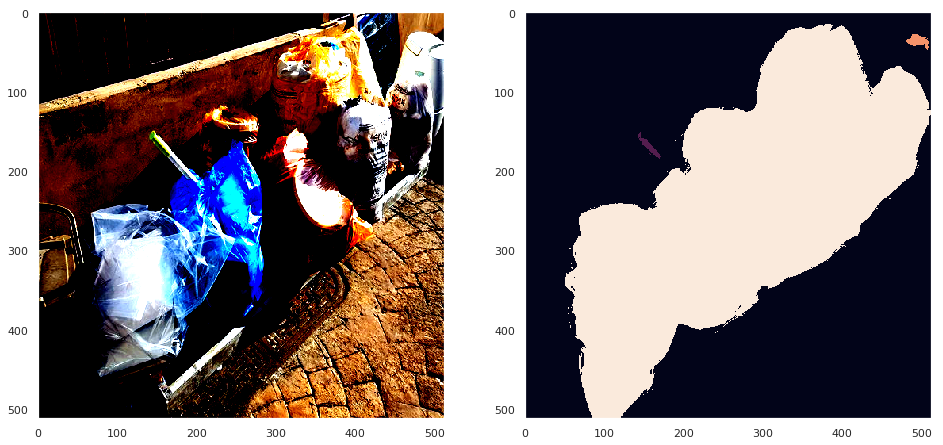

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


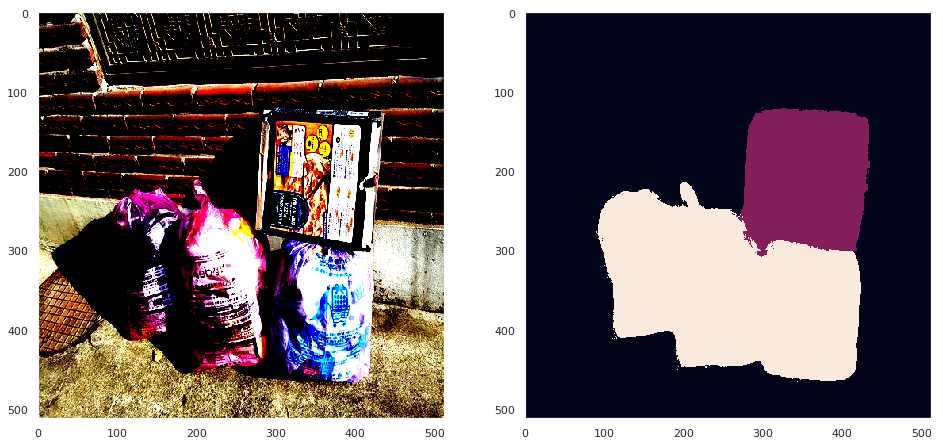

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


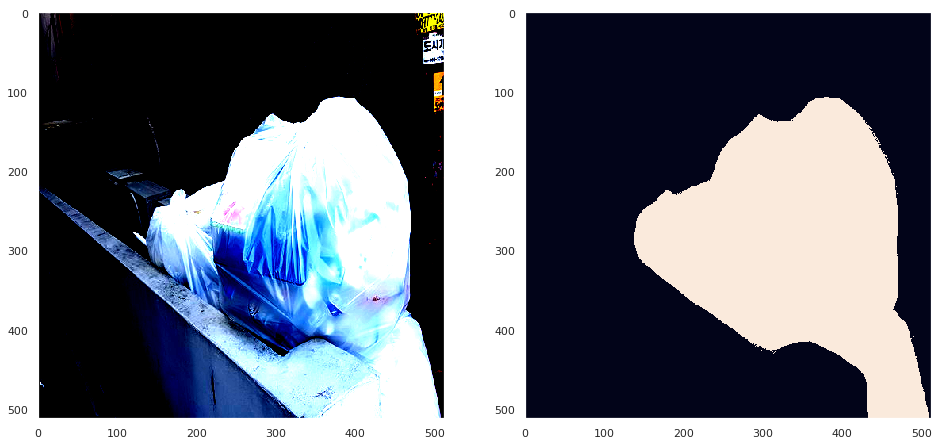

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


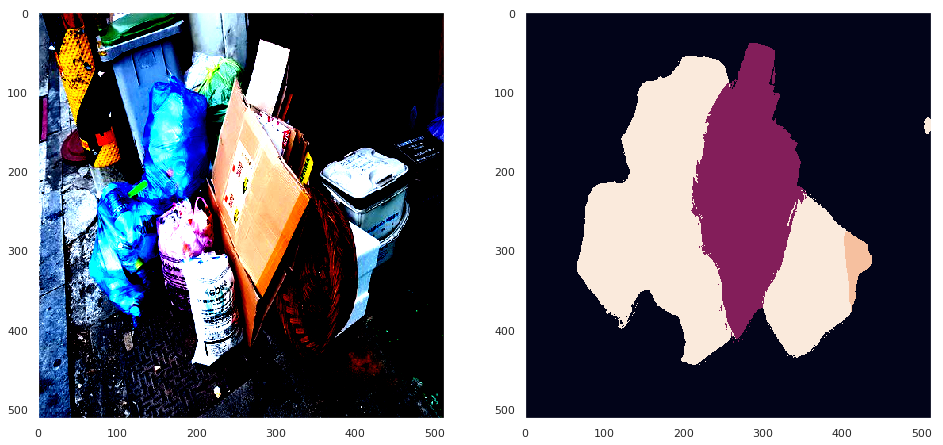

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


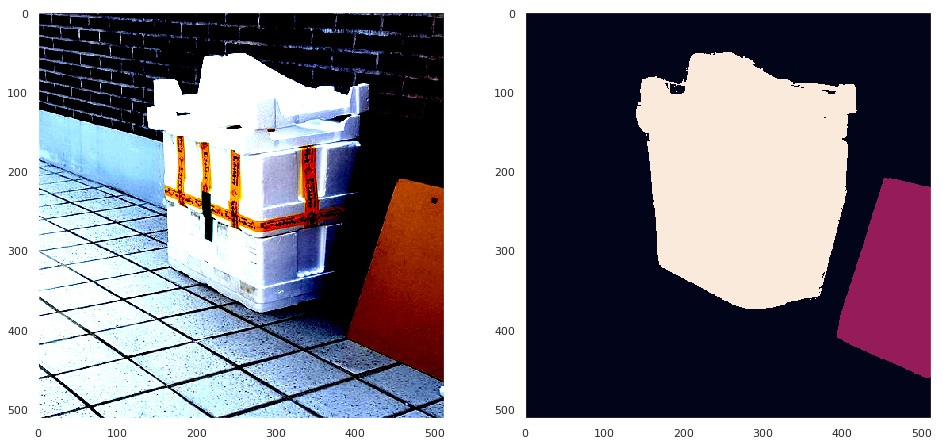

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


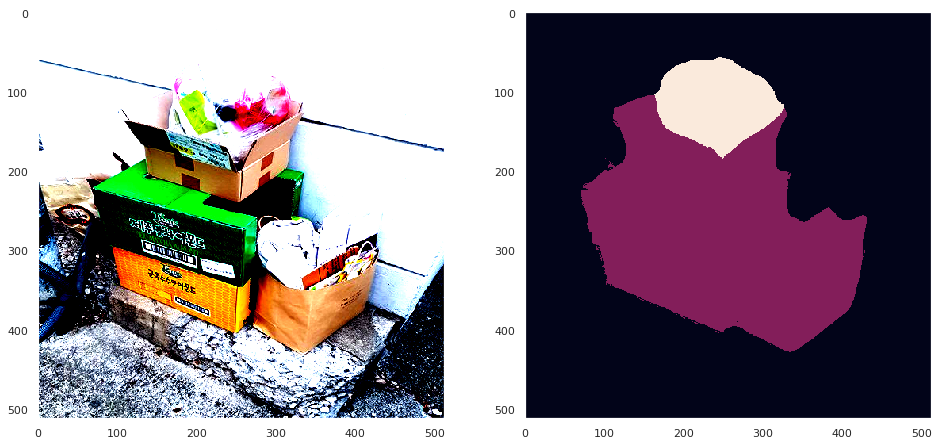

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


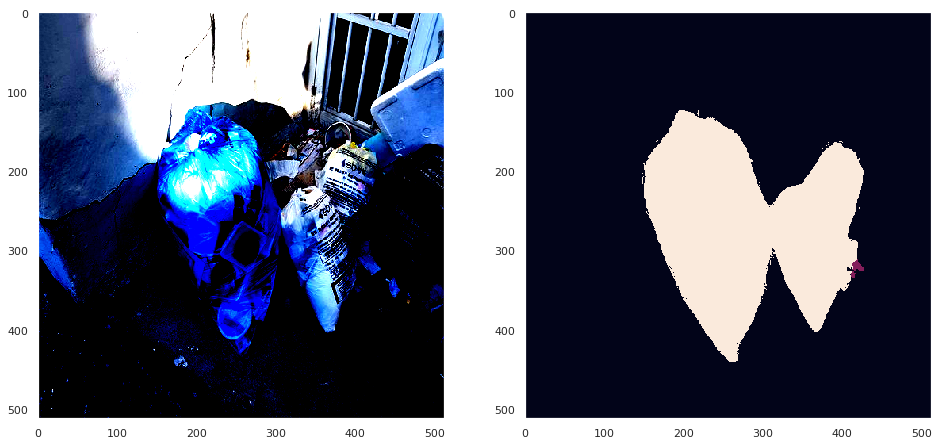

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


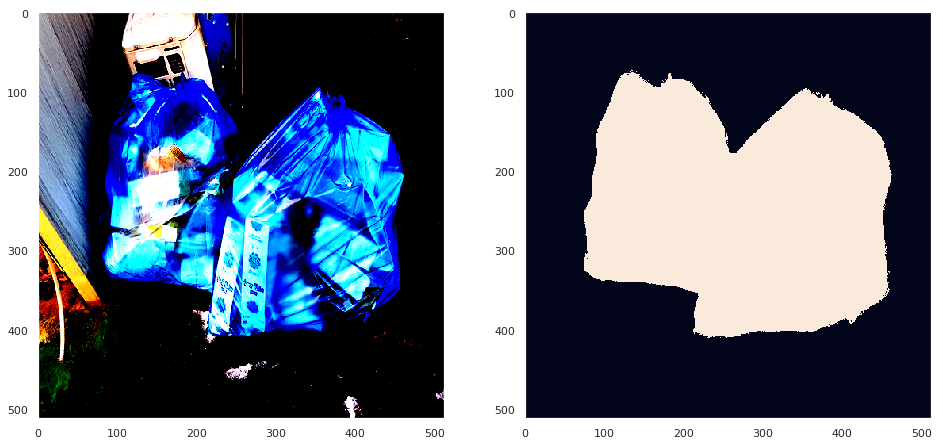

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


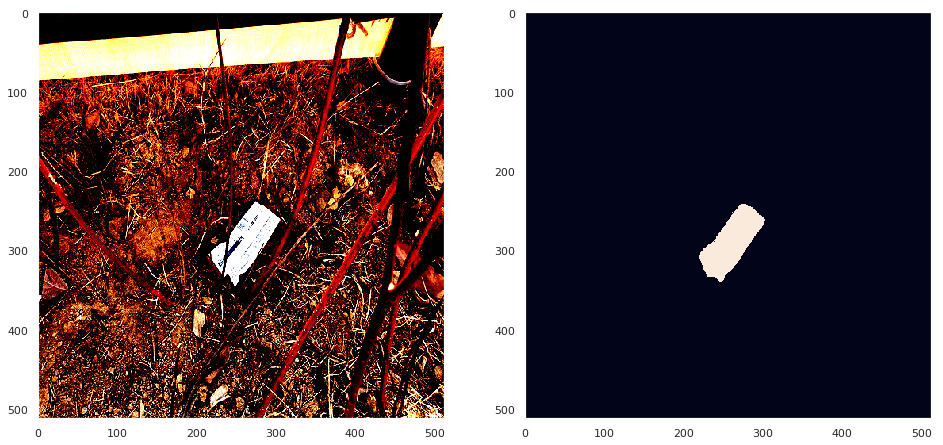

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


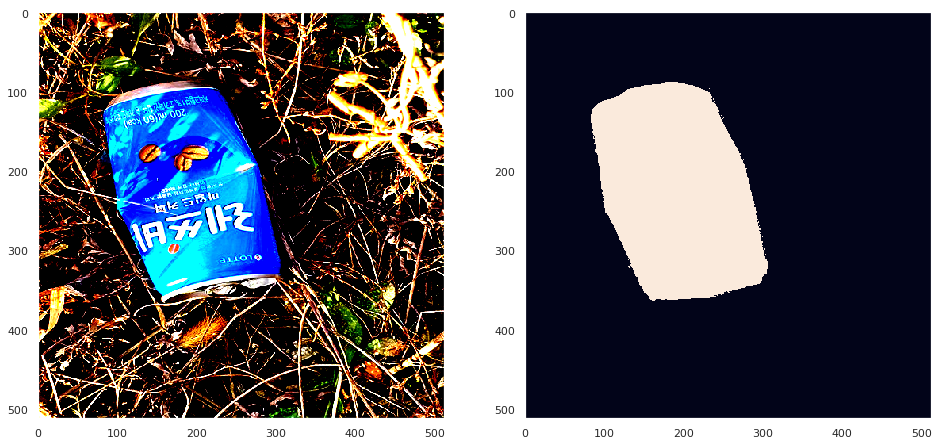

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


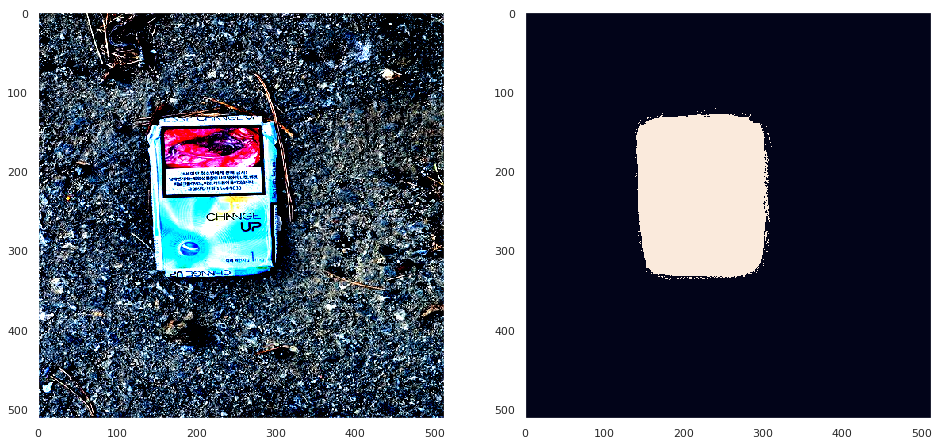

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


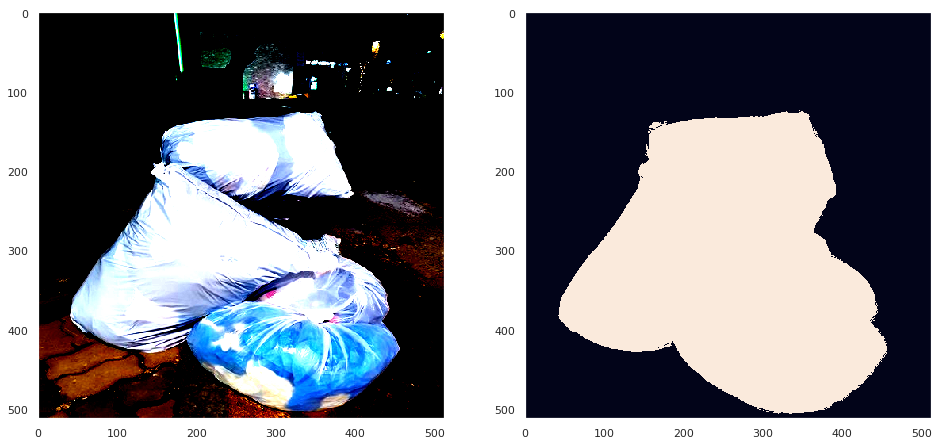

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


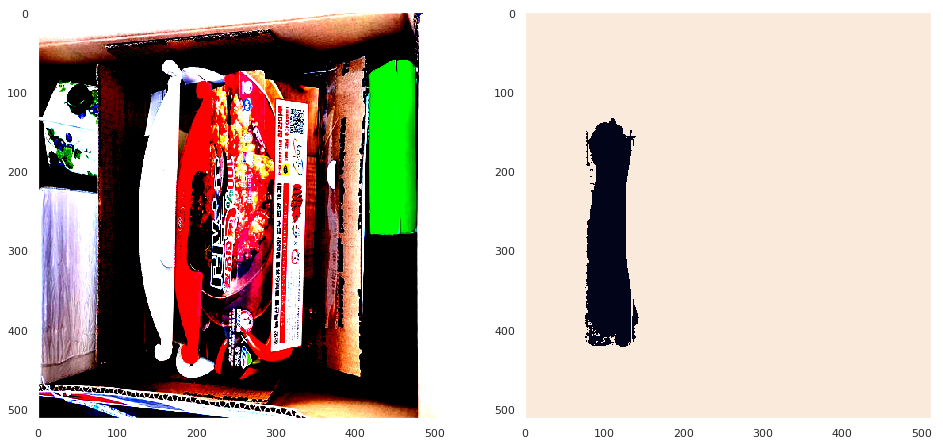

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


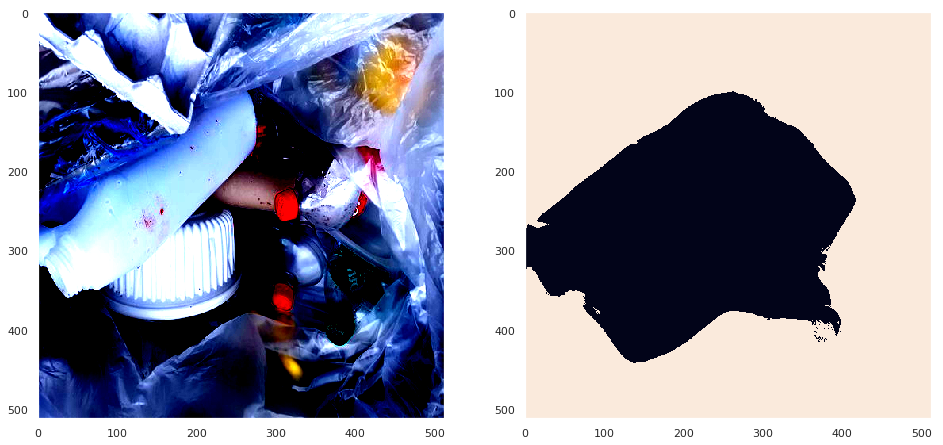

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


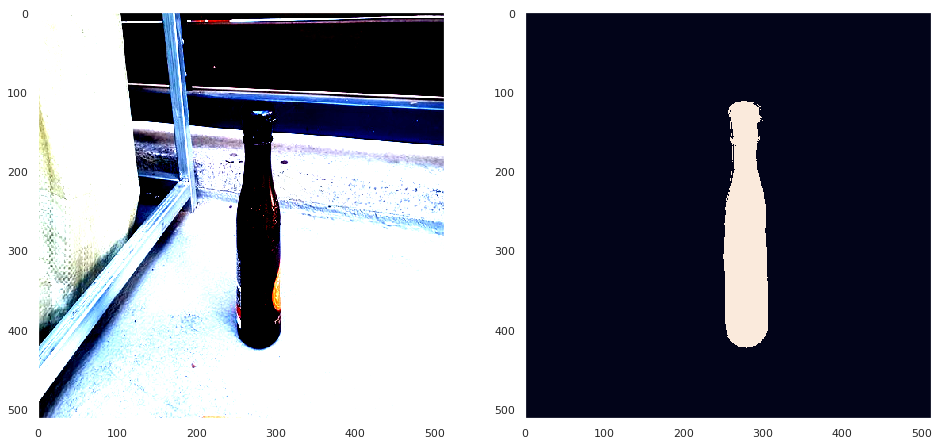

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


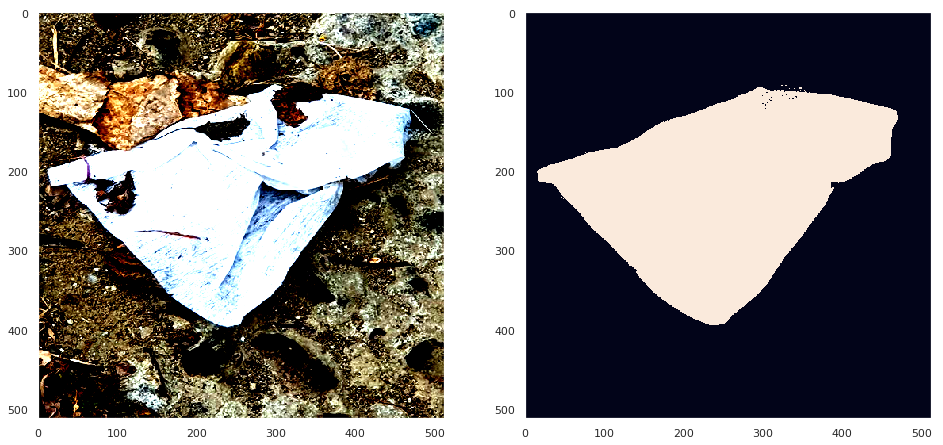

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


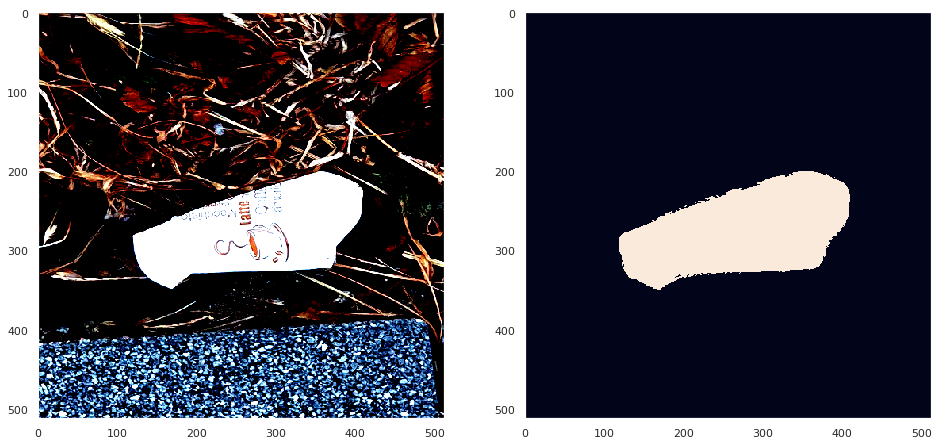

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


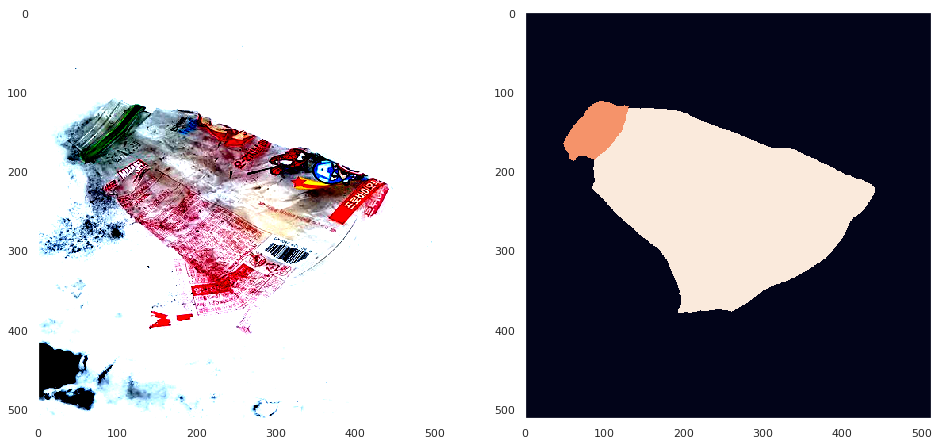

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


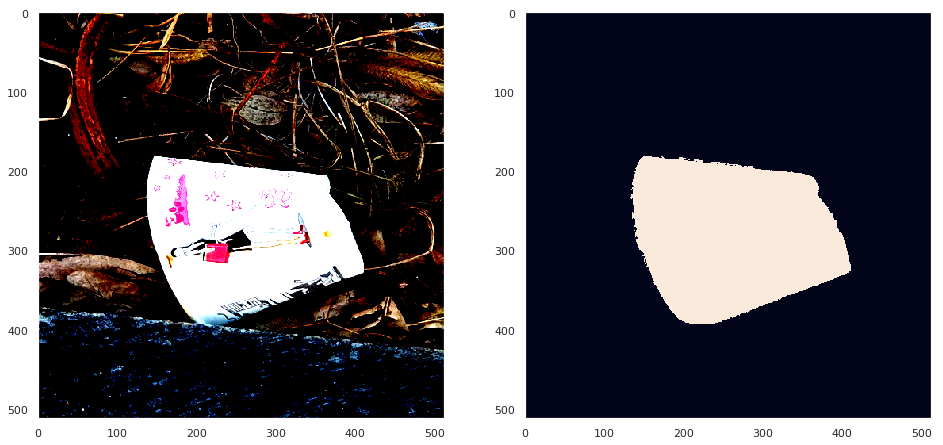

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


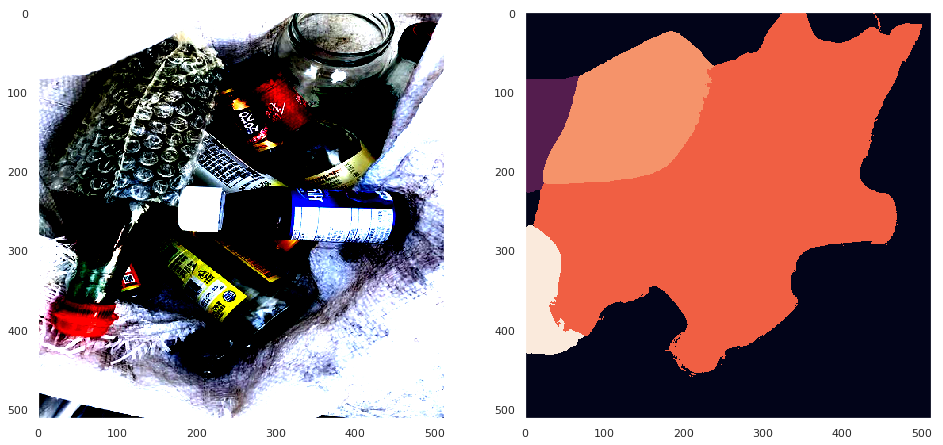

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


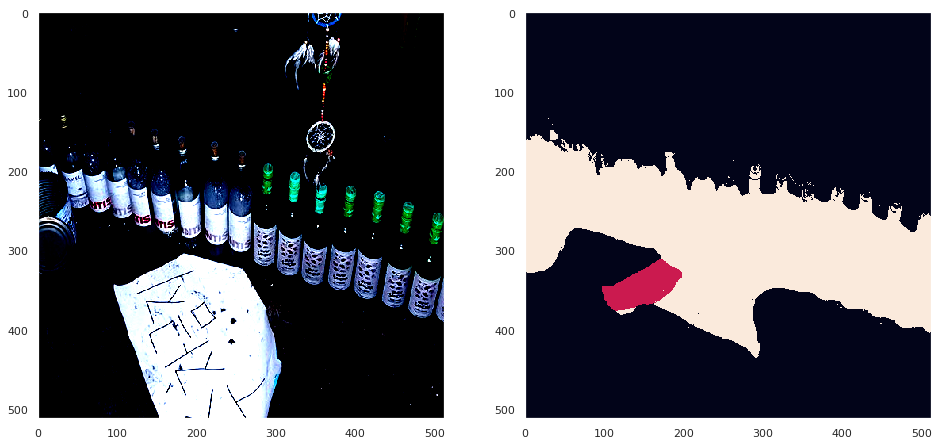

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


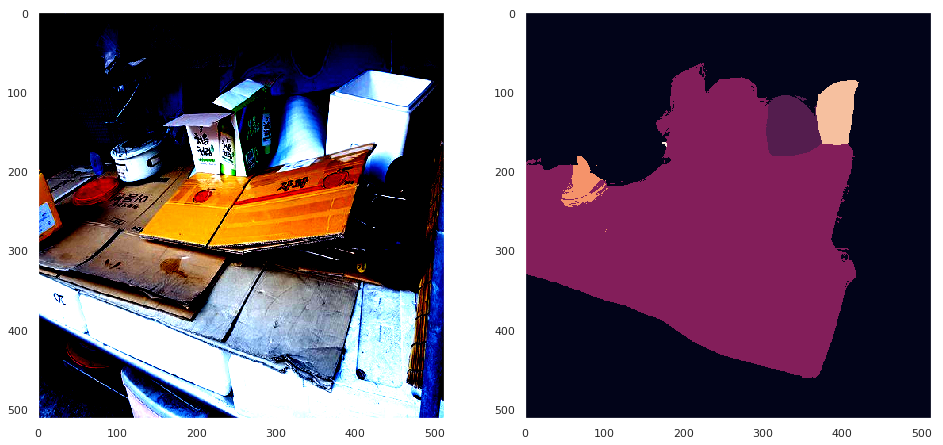

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


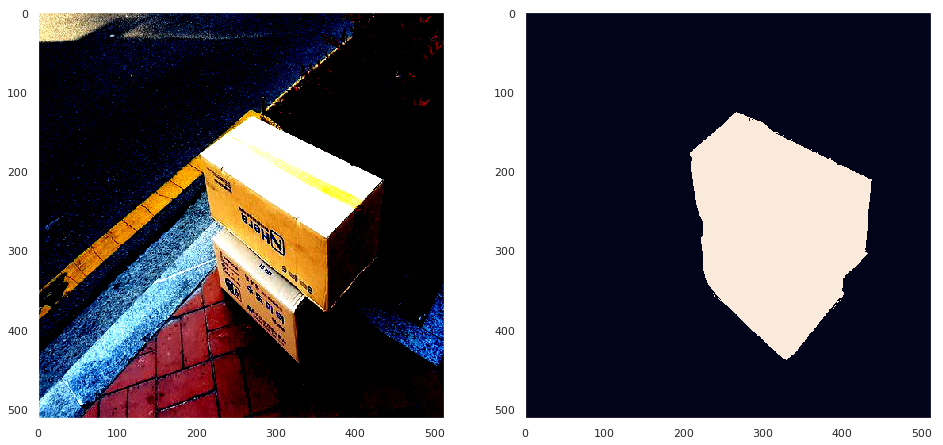

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


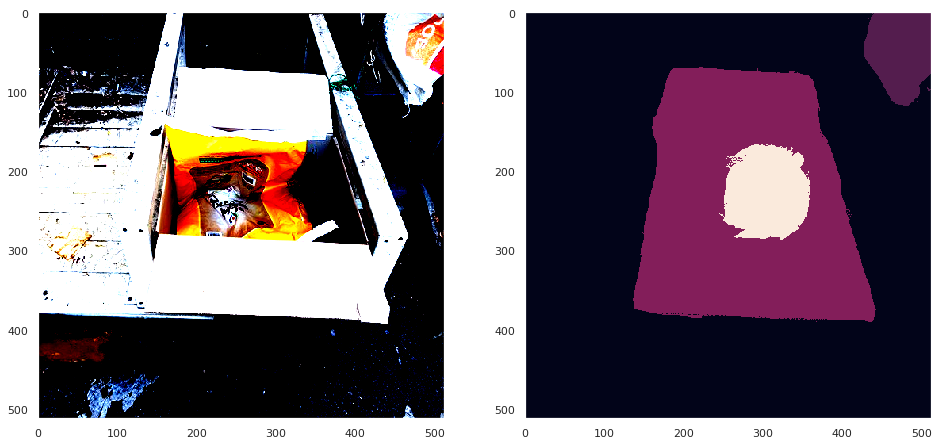

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


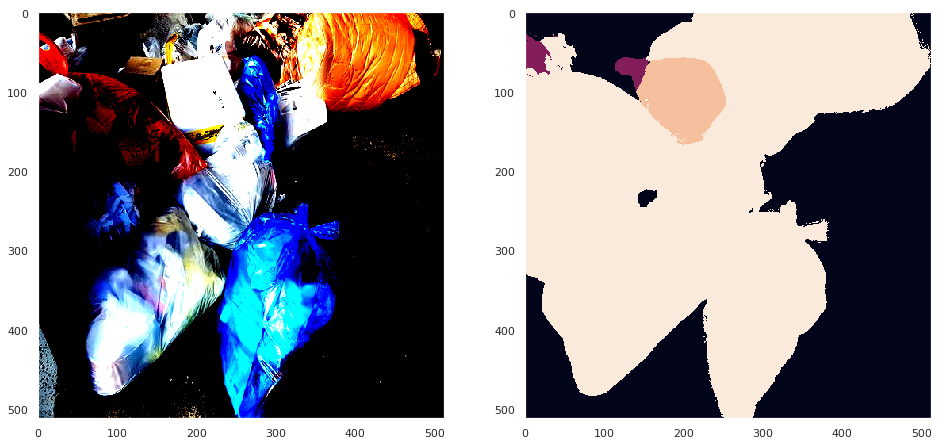

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


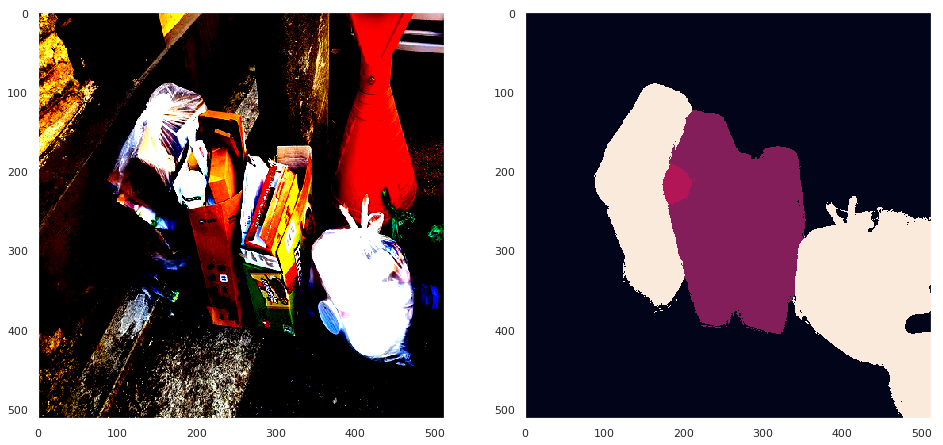

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


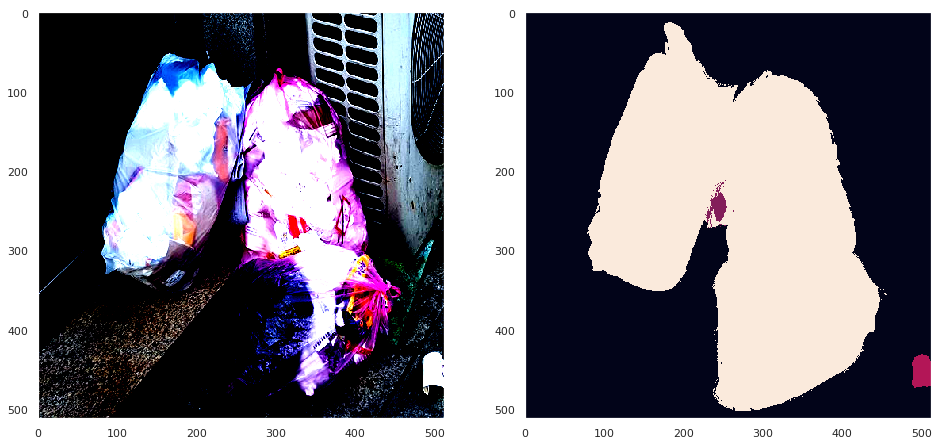

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


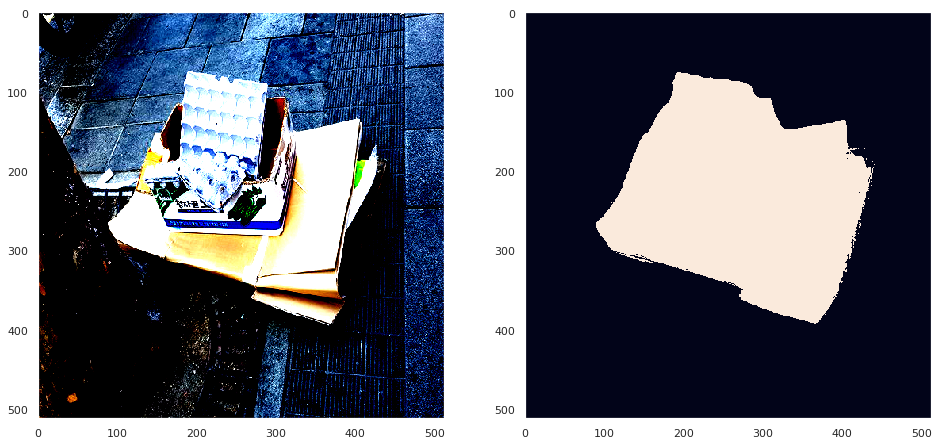

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


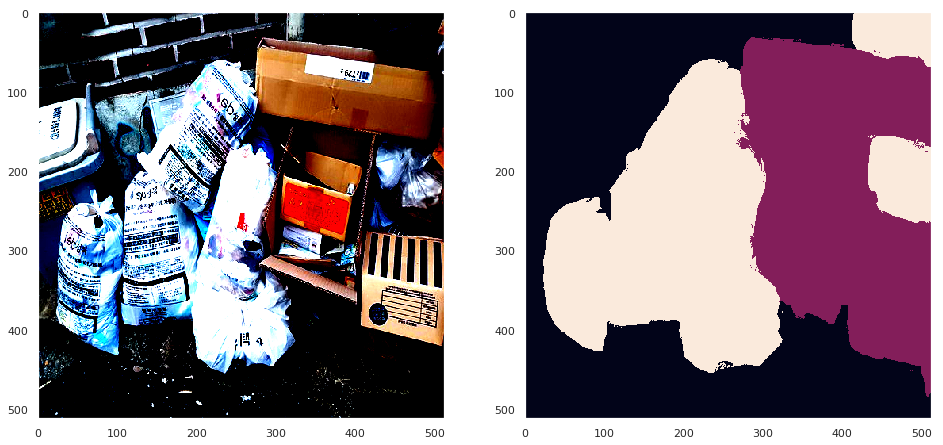

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


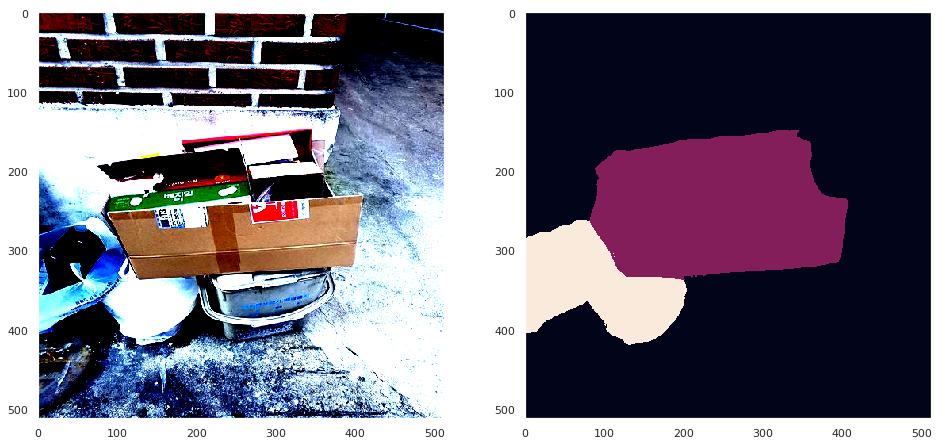

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


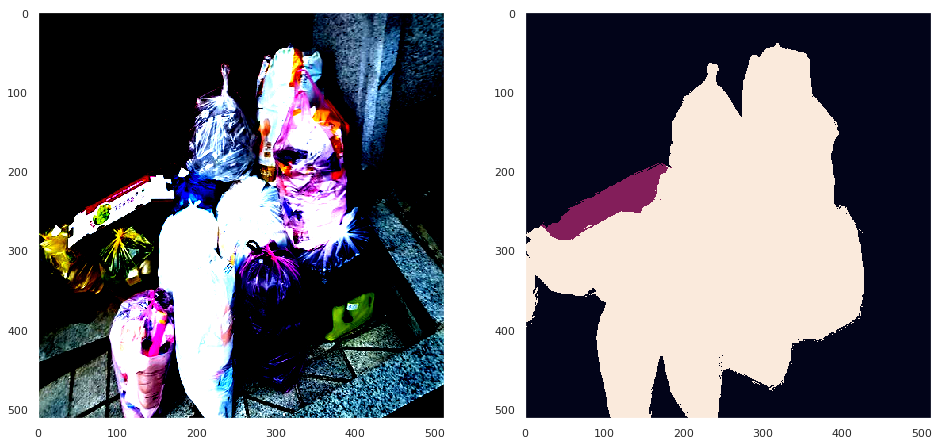

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


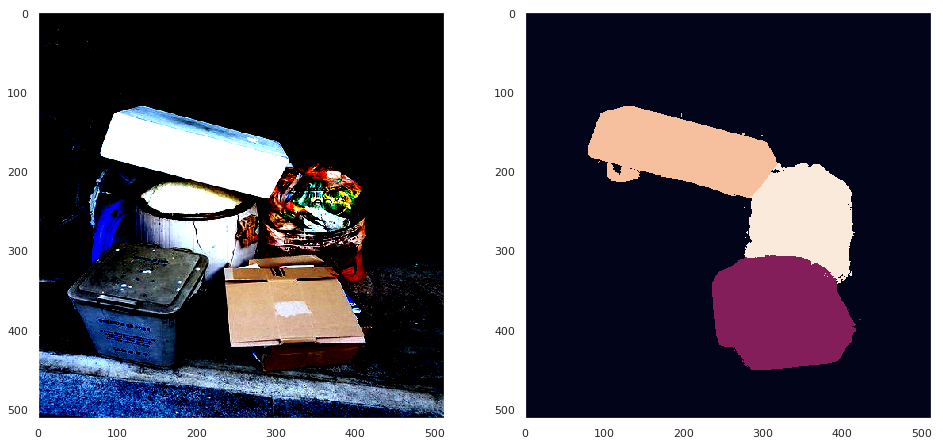

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


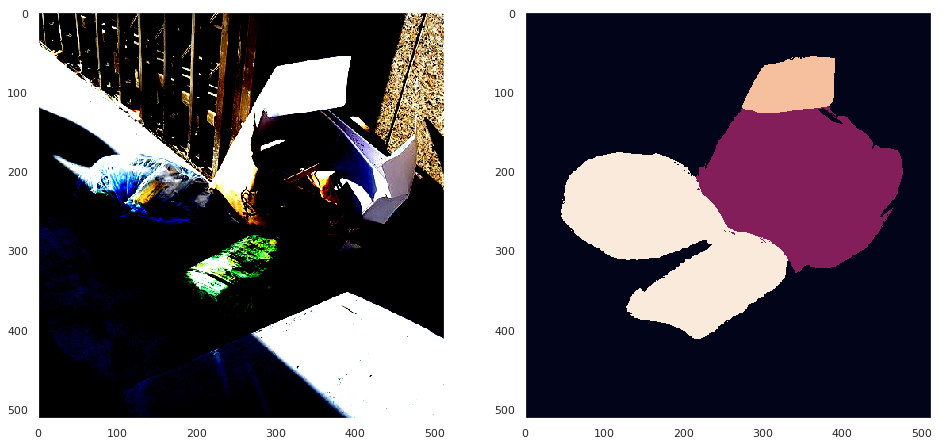

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


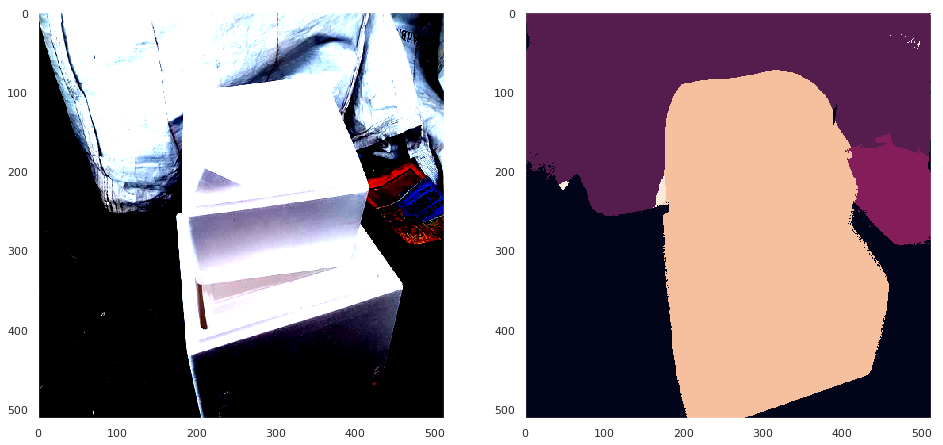

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


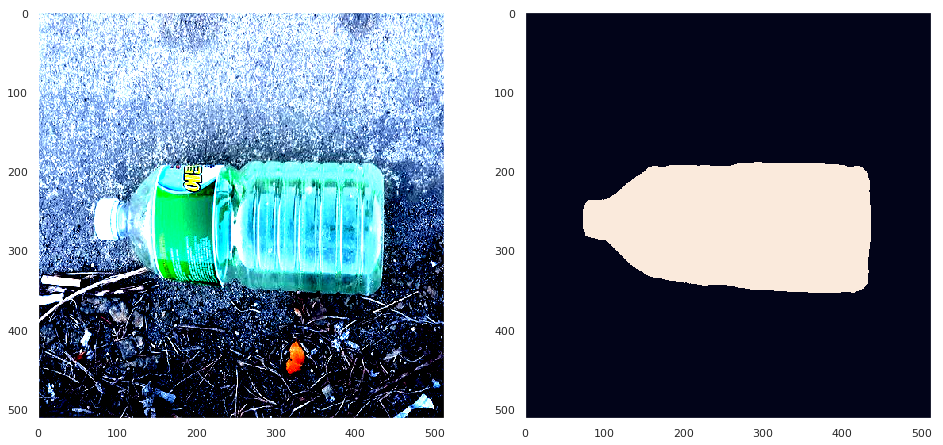

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


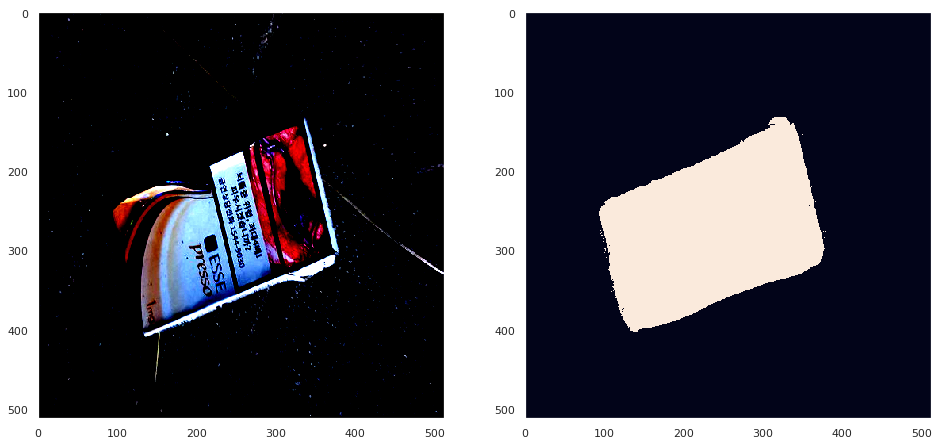

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


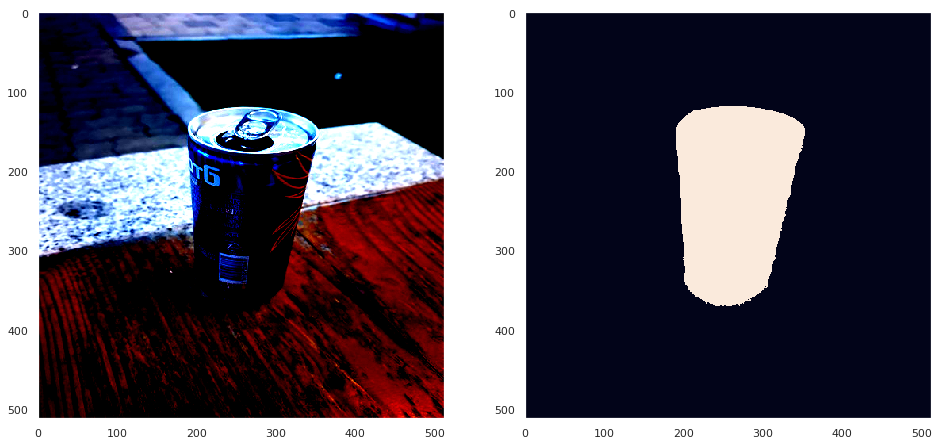

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


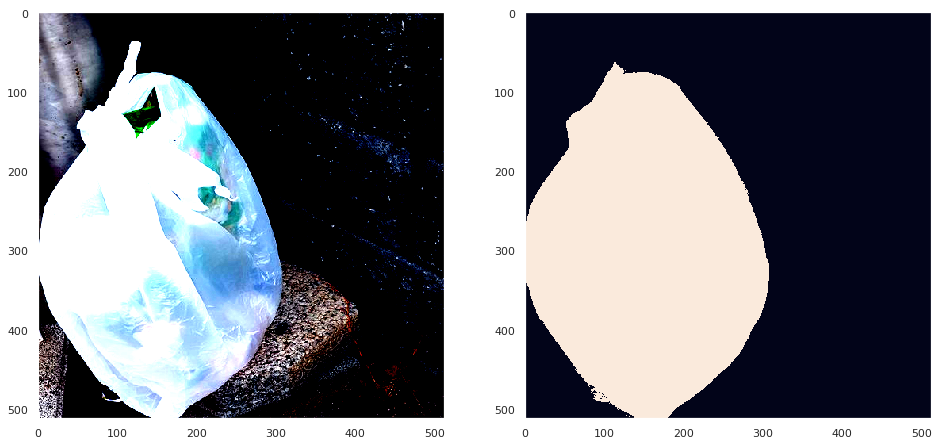

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


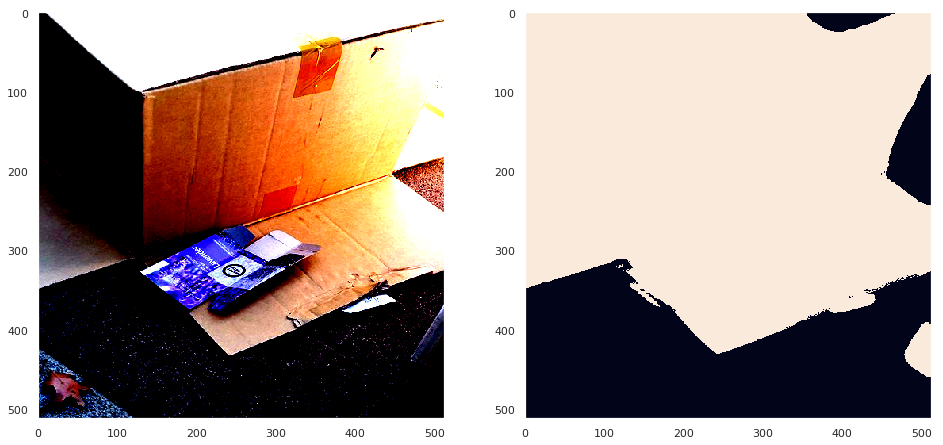

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of Original Image : [512, 512, 3]
Shape of Predicted :  [512, 512]


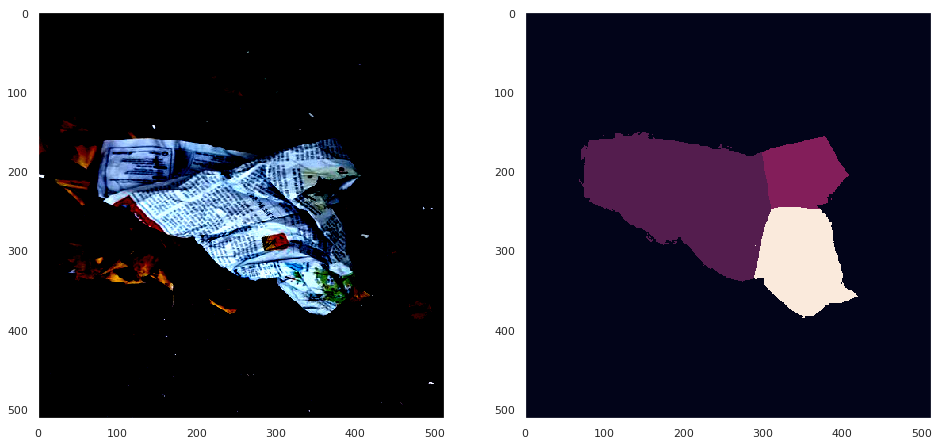

In [61]:
with torch.no_grad():
    for step, (imgs, image_infos) in enumerate(test_loader):

        # (batch,channel,512,512)
        # inference (512 x 512)
        outs = model(torch.stack(imgs).to(device))

        for i in range(len(imgs)):
            invTrans = transforms.Compose([ transforms.Normalize(mean = [ 0., 0., 0. ],
                                                                 std = [ 1/0.229, 1/0.224, 1/0.225 ]),
                                            transforms.Normalize(mean = [ -0.485, -0.456, -0.406 ],
                                                                 std = [ 1., 1., 1. ]),
                                           ])

            image1=imgs[i]
            mask1=outs[i]
            image1=invTrans(image1)
            image1=image1.detach().cpu().numpy()
            mask1=mask1.detach().cpu().numpy()
            image1=image1.transpose(1,2,0)

            n_classes=12
            feat_first = mask1.reshape((n_classes,-1))
            unary = unary_from_softmax(feat_first)
            unary=np.ascontiguousarray(unary)
            d = dcrf.DenseCRF2D(image1.shape[1], image1.shape[0], n_classes)
            d.setUnaryEnergy(unary)
            d.addPairwiseGaussian(sxy=(5, 5), compat=3, kernel=dcrf.DIAG_KERNEL,
                                    normalization=dcrf.NORMALIZE_SYMMETRIC)

            d.addPairwiseBilateral(sxy=(30, 30), srgb=(13, 13, 13), rgbim=image1.astype(np.uint8),
                                compat=10,
                                kernel=dcrf.DIAG_KERNEL,
                                normalization=dcrf.NORMALIZE_SYMMETRIC)

            Q = d.inference(5)
            res = np.argmax(Q, axis=0).reshape((image1.shape[0], image1.shape[1]))
            fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(16, 16))

            print('Shape of Original Image :', list(image1.shape))
            print('Shape of Predicted : ', list(res.shape))


            # Original image
            ax1.imshow(image1)
            ax1.grid(False)

            # Predicted
            ax2.imshow(res)
            ax2.grid(False)


            plt.show()
            break
            transformed = transform(image=image1, mask=res)
            mask=transformed['mask']
            mask=mask.reshape([1,256*256]).astype(int)
            preds_array=np.vstack((preds_array,mask))
